In [85]:
import ee
import geopandas as gpd
from src.data import gedi_pipeline
from src.data.ee import lcms_import
from src.processing.regen import regen_analysis
from src.data import ee_utils
from src.data.fire_perimeters import FirePerimeters, FirePerimetersDB, Fire, match_gedi_to_raster, FireRastersDB
from src.data import fire_perimeters
from src.data import gedi_raster_matching
from src.data import raster
import rasterio as rio
import matplotlib.pyplot as plt
import pandas as pd
from src.constants import DATA_PATH, USER_PATH
from fitter import Fitter, get_common_distributions, get_distributions
import seaborn as sns
from fastai.tabular.all import save_pickle
from src.visualization.dists import plot_pdf
from src.data import gedi_pipeline
import seaborn as sns

sns.set_theme()

import importlib
importlib.reload(regen_analysis)
importlib.reload(gedi_pipeline)
importlib.reload(ee_utils)
importlib.reload(gedi_raster_matching)
importlib.reload(raster)
importlib.reload(fire_perimeters)

2023-06-18 22:45:37,287 DEBUG: Logger /home/jk871/fire-regen/src/data/gedi_pipeline.py already set up. [in get_logger at /home/jk871/fire-regen/src/utils/logging_util.py:51]
2023-06-18 22:45:37,288 DEBUG: Logger /home/jk871/fire-regen/src/data/ee_utils.py already set up. [in get_logger at /home/jk871/fire-regen/src/utils/logging_util.py:51]
2023-06-18 22:45:37,290 DEBUG: Logger /home/jk871/fire-regen/src/data/gedi_raster_matching.py already set up. [in get_logger at /home/jk871/fire-regen/src/utils/logging_util.py:51]
2023-06-18 22:45:37,291 DEBUG: Logger /home/jk871/fire-regen/src/data/fire_perimeters.py already set up. [in get_logger at /home/jk871/fire-regen/src/utils/logging_util.py:51]


<module 'src.data.fire_perimeters' from '/home/jk871/fire-regen/src/data/fire_perimeters.py'>

In [11]:
gedi_recovery_3x3 = regen_analysis.process_all_fires_with_rf_control_per_burn_year(f"{DATA_PATH}/rf/burned/3x3", f"{DATA_PATH}/rf/models_ver_B")

Process fires for year 1985.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1986.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1987.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1988.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1989.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1990.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1991.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1992.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1993.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1994.
matching shots within fire
Processi

In [12]:
gedi_recovery_2x2 = regen_analysis.process_all_fires_with_rf_control_per_burn_year(f"{DATA_PATH}/rf/burned/2x2", f"{DATA_PATH}/rf/models_ver_B")

Process fires for year 1985.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1986.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1987.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1988.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1989.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1990.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1991.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1992.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1993.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1994.
matching shots within fire
Processi

### Time series plots

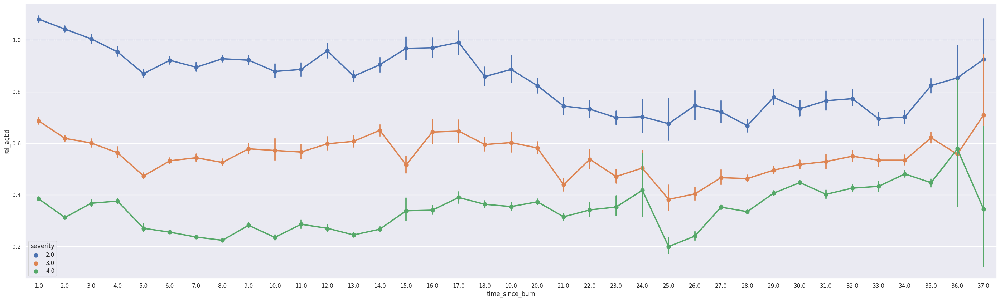

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_recovery_2x2, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

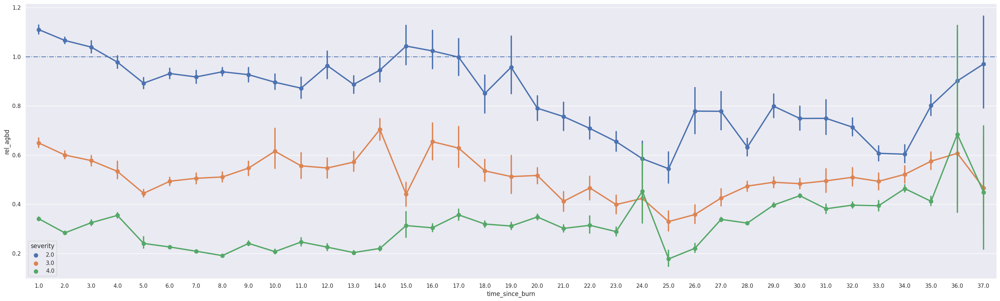

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_recovery_3x3, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

Here, we filter out samples to only look at pft_class == 1. It's worth noting that if we don't do so, we get a much less
clearer line of recovery (like above). The problem is that pft_class stratifies carbon estimates and is
drawing from different AGBD models - so putting them on the same graph doesn't make sense.

PFT is also determined from MODIS, which has 500 m resolution.

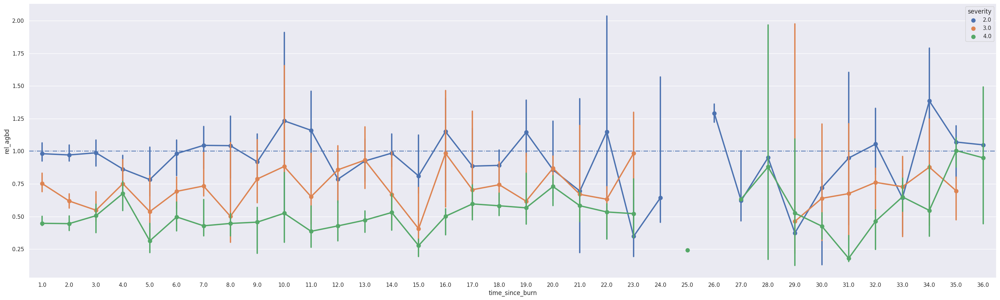

In [151]:
filter_2x2 = gedi_recovery_2x2[(gedi_recovery_2x2.pft_class == 1) & (gedi_recovery_2x2.burn_count == 1) & (gedi_recovery_2x2.slope > 30) & (gedi_recovery_2x2.elevation > 1500)]
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(filter_2x2, x='time_since_burn', y='rel_agbd', hue='severity', estimator="median")
ax.axhline(y=1, linestyle="-.")

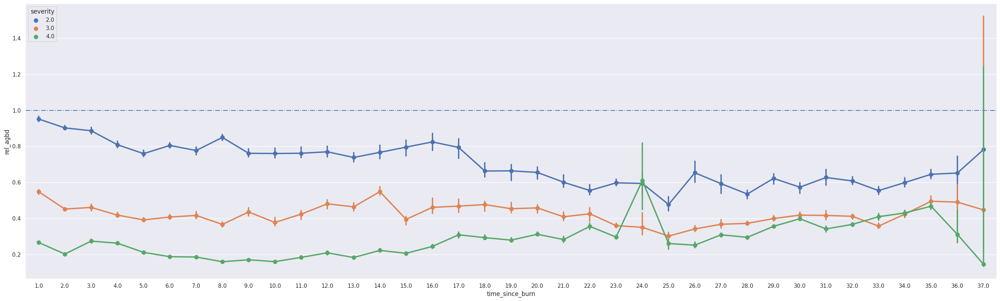

In [147]:
filter_2x2 = gedi_recovery_2x2[(gedi_recovery_2x2.pft_class == 1) & (gedi_recovery_2x2.burn_count == 1)]
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(filter_2x2, x='time_since_burn', y='rel_agbd', hue='severity', estimator="median")
ax.axhline(y=1, linestyle="-.")

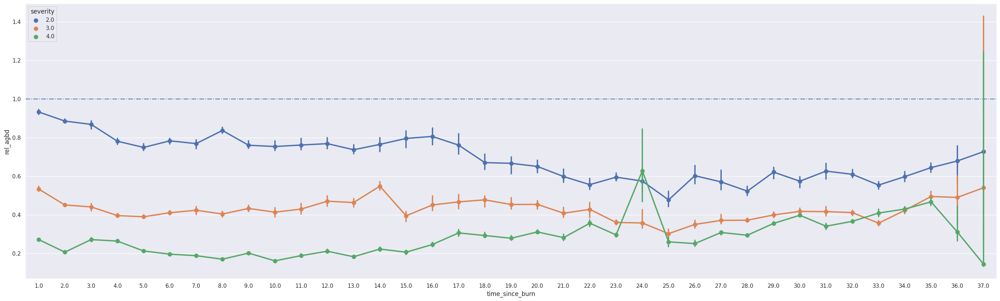

In [132]:
filter_2x2 = gedi_recovery_2x2[(gedi_recovery_2x2.pft_class == 1)]
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(filter_2x2, x='time_since_burn', y='rel_agbd', hue='severity', estimator="median")
ax.axhline(y=1, linestyle="-.")

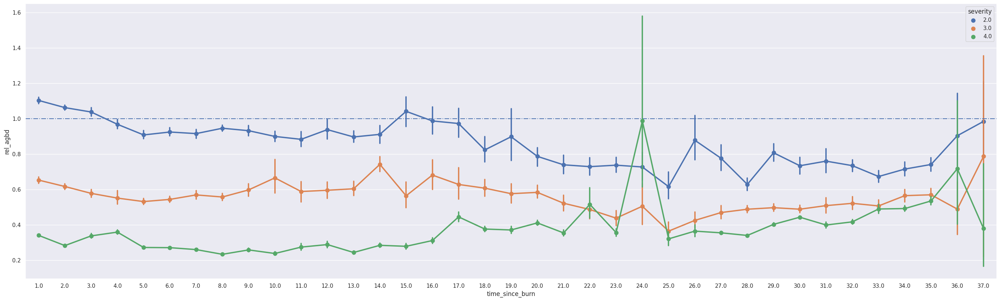

In [130]:
filter_3x3= gedi_recovery_3x3[(gedi_recovery_3x3.pft_class == 1)]
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(filter_3x3, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

87898


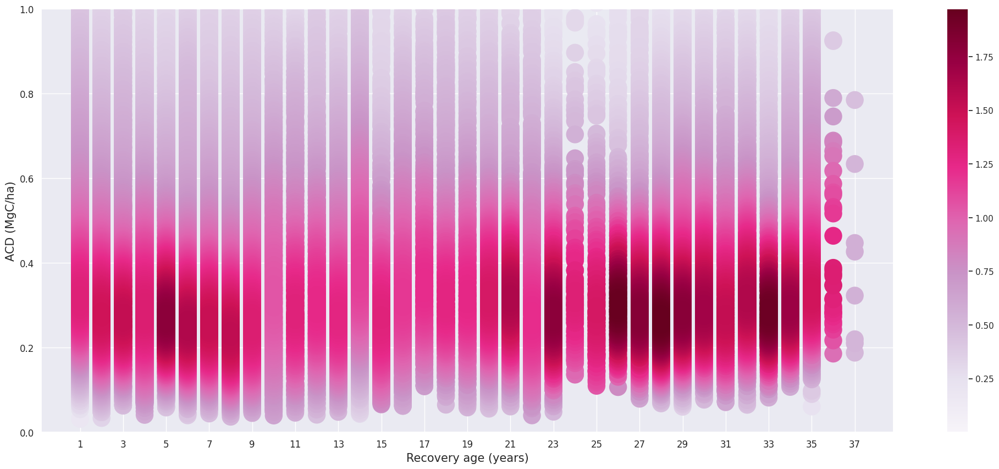

In [27]:
plot_pdf(filter_2x2[filter_2x2.severity == 3],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

32607


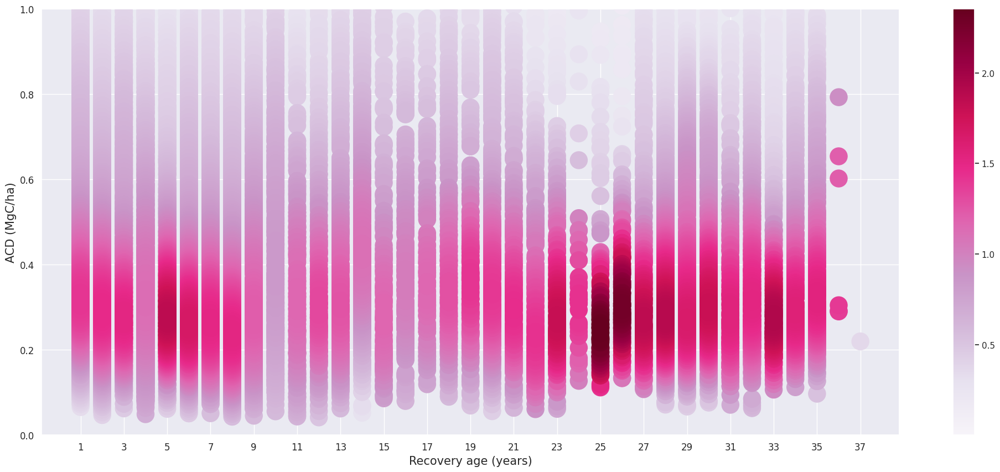

In [28]:
plot_pdf(filter_3x3[filter_3x3.severity == 3],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

130194


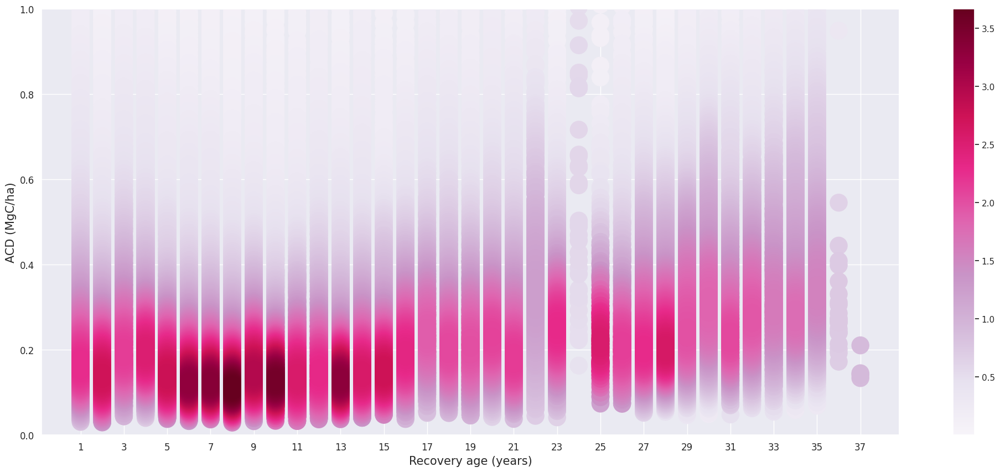

In [30]:
plot_pdf(filter_2x2[filter_2x2.severity == 4],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

93248


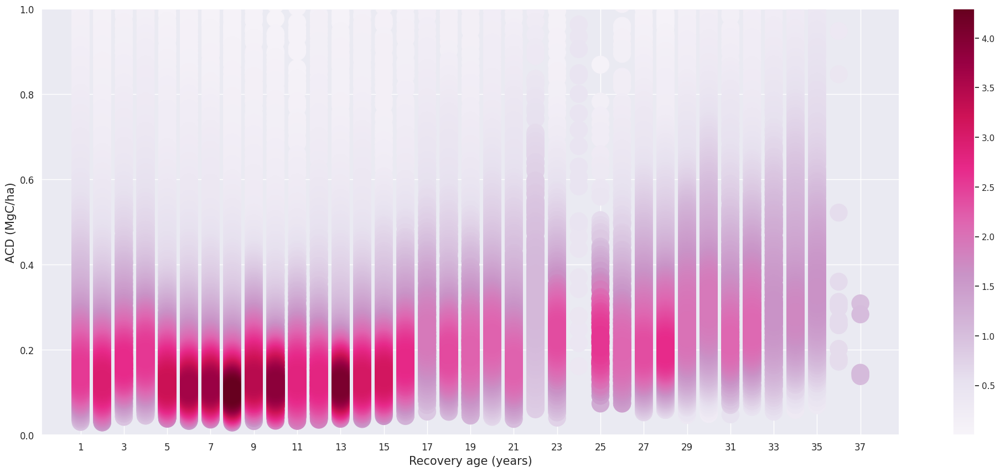

In [31]:
plot_pdf(filter_3x3[filter_3x3.severity == 4],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

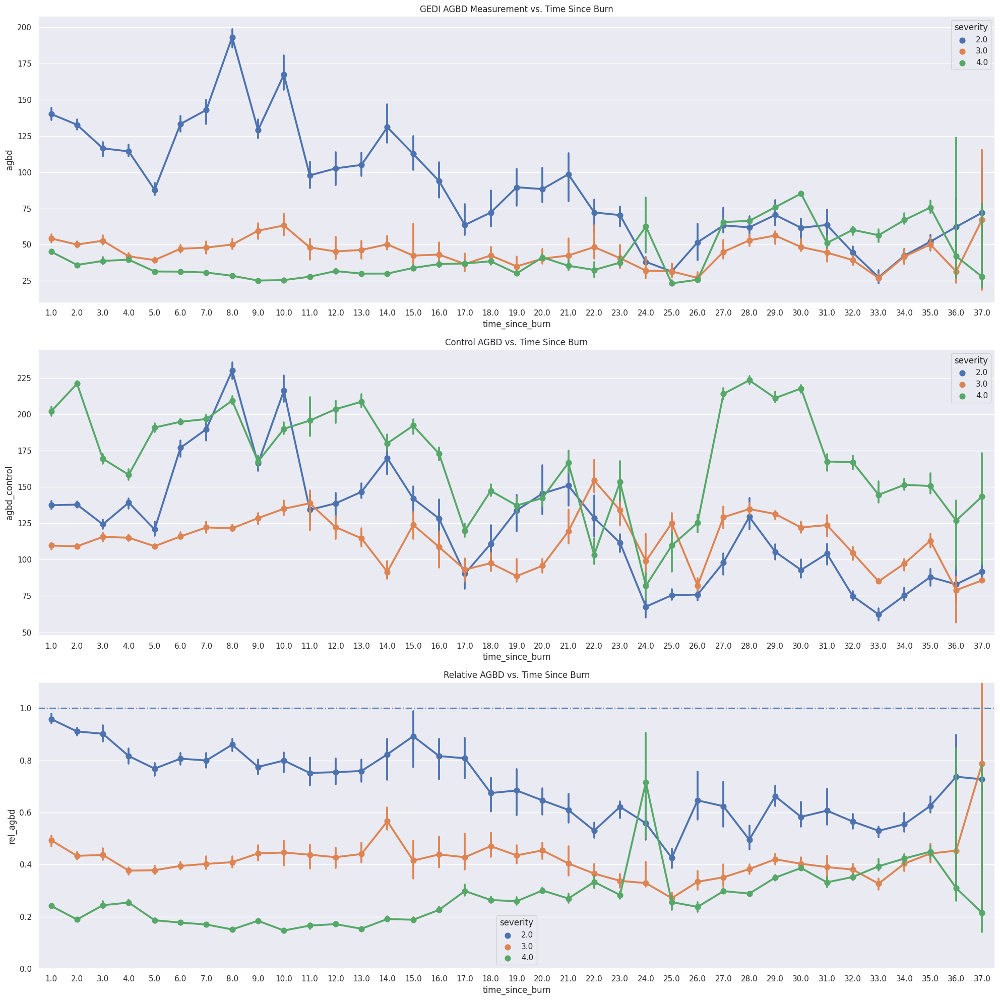

In [67]:
fig, ax = plt.subplots(3, 1, figsize=(20, 20))
sns.pointplot(filter_3x3, x='time_since_burn', y='agbd', hue='severity', estimator='median', ax=ax[0])
sns.pointplot(filter_3x3, x='time_since_burn', y='agbd_control', hue='severity', estimator='median', ax=ax[1])
sns.pointplot(filter_3x3, x='time_since_burn', y='rel_agbd', hue='severity', estimator='median', ax=ax[2])
ax[2].axhline(y=1, linestyle="-.")

ax[0].set_title("GEDI AGBD Measurement vs. Time Since Burn")
ax[1].set_title("Control AGBD vs. Time Since Burn")
ax[2].set_title("Relative AGBD vs. Time Since Burn")

ax[2].set_ylim((0, 1.1))
fig.tight_layout()

### Recovery grouping

We will use 2x2 burn area filtering, as it produces many more data points that we can work with.

Right now, we will group recovery into buckets of 1, 3, 5, 7 and 10 years and plot it. The one that we like the most visually will be the one to keep.

Other than visual representation, we can try to run ANOVA test and find the interval that yields the most difference.

In [87]:
grouped = gedi_pipeline.add_time_since_burn_categories_3(filter_2x2)

In [88]:
grouped = gedi_pipeline.add_time_since_burn_categories_5(grouped)
grouped = gedi_pipeline.add_time_since_burn_categories_7(grouped)
grouped = gedi_pipeline.add_time_since_burn_categories_10(grouped)

(0.0, 2.0)

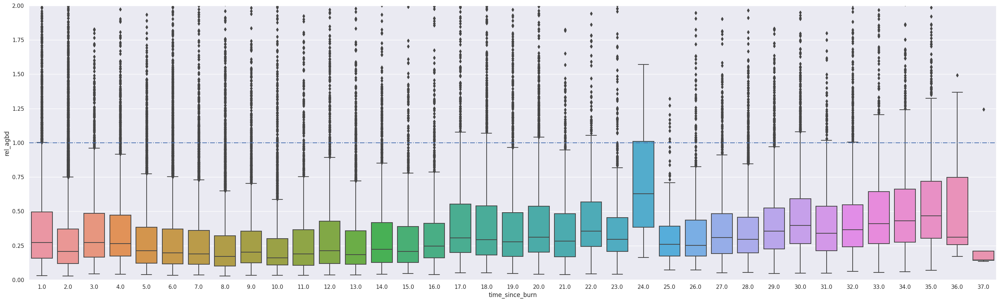

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.boxplot(gedi_pipeline.get_severity(grouped, 4), x='time_since_burn', y='rel_agbd')
ax.axhline(y=1, linestyle="-.")
ax.set_ylim((0, 2))

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn', y='rel_agbd', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

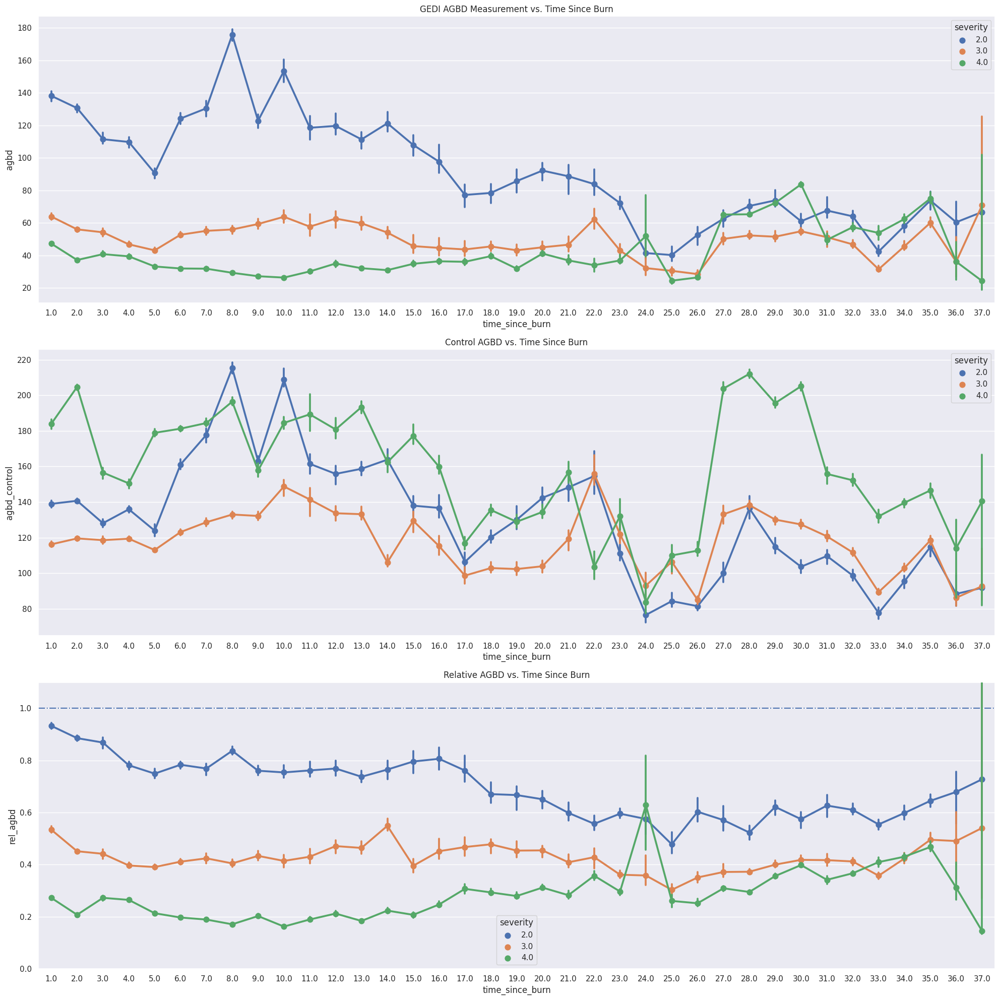

In [66]:
fig, ax = plt.subplots(3, 1, figsize=(20, 20))
sns.pointplot(grouped, x='time_since_burn', y='agbd', hue='severity', estimator='median', ax=ax[0])
sns.pointplot(grouped, x='time_since_burn', y='agbd_control', hue='severity', estimator='median', ax=ax[1])
sns.pointplot(grouped, x='time_since_burn', y='rel_agbd', hue='severity', estimator='median', ax=ax[2])
ax[2].axhline(y=1, linestyle="-.")

ax[0].set_title("GEDI AGBD Measurement vs. Time Since Burn")
ax[1].set_title("Control AGBD vs. Time Since Burn")
ax[2].set_title("Relative AGBD vs. Time Since Burn")

ax[2].set_ylim((0, 1.1))
fig.tight_layout()

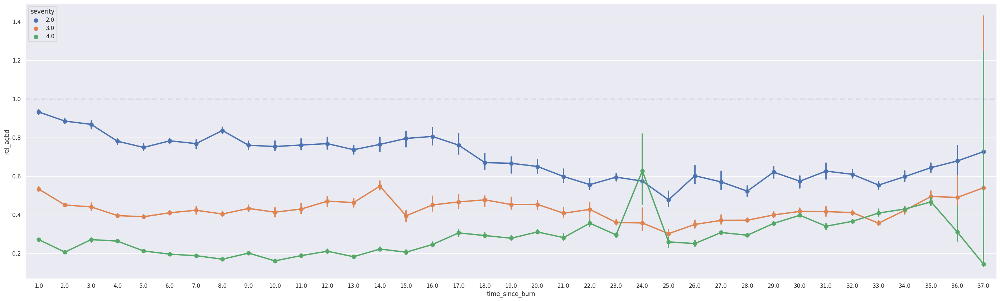

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn', y='rel_agbd', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

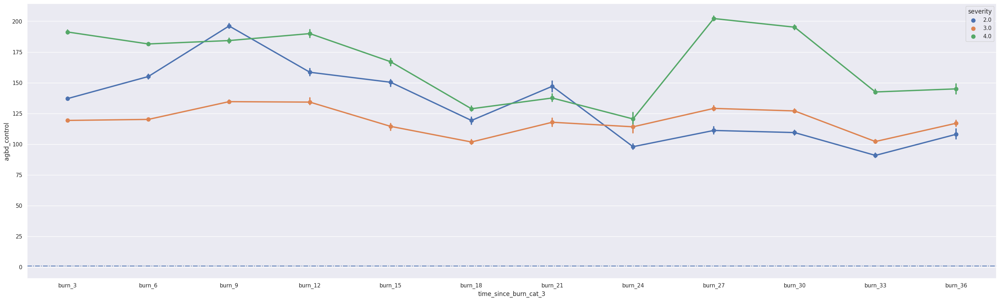

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_3', y='agbd_control', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

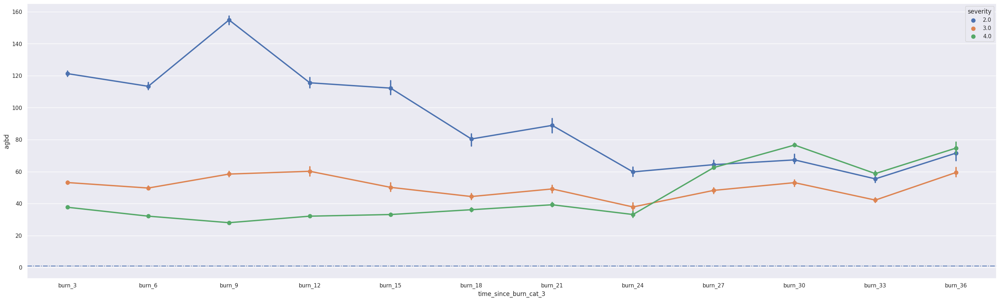

In [61]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_3', y='agbd', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

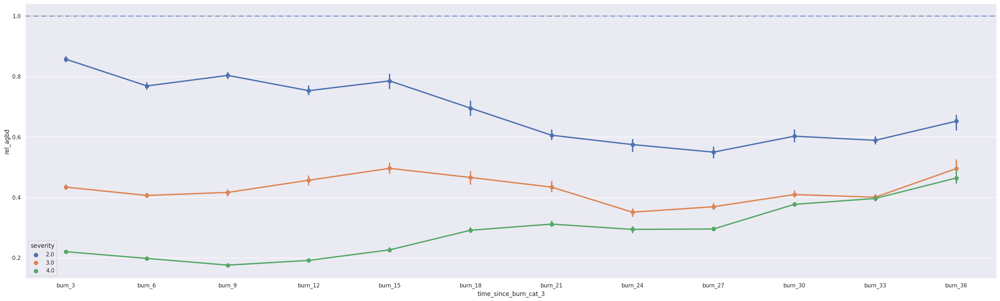

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_3', y='rel_agbd', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

(0.0, 1.5)

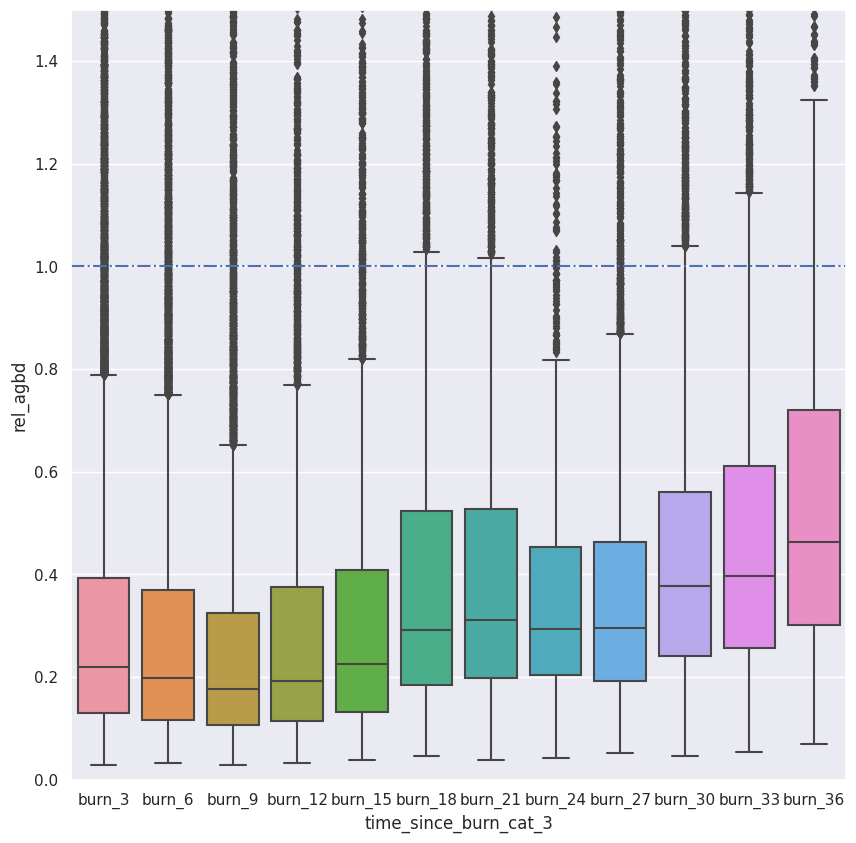

In [53]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.boxplot(gedi_pipeline.get_severity(grouped, 4), x='time_since_burn_cat_3', y='rel_agbd', ax=ax)
ax.axhline(y=1, linestyle="-.")
ax.set_ylim((0, 1.5))

(0.0, 1.5)

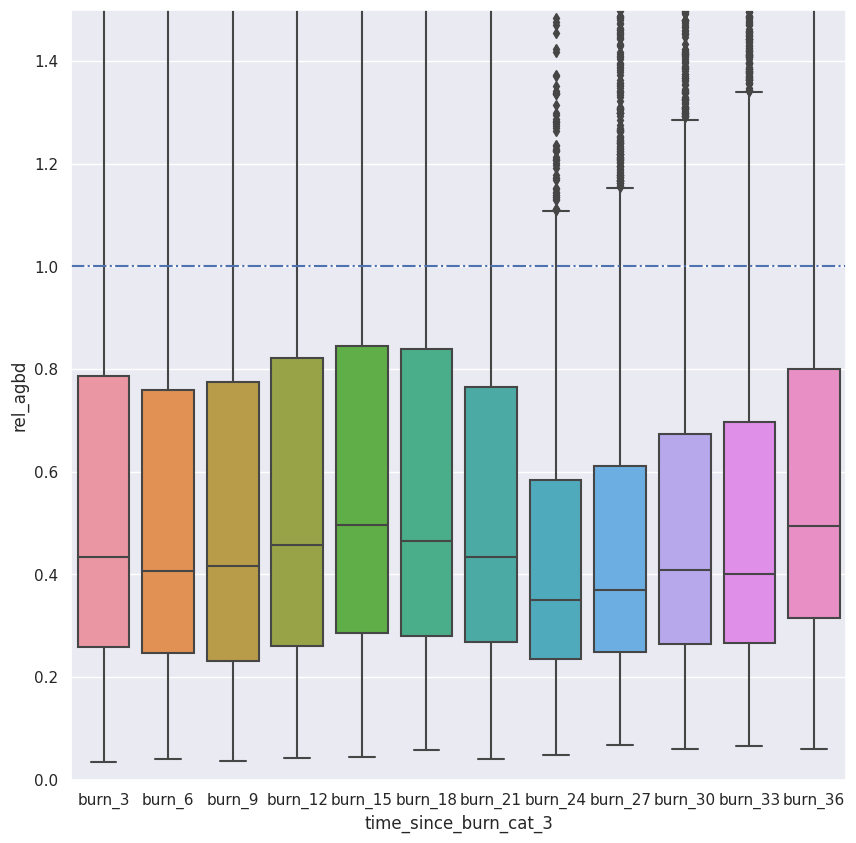

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.boxplot(gedi_pipeline.get_severity(grouped, 3), x='time_since_burn_cat_3', y='rel_agbd', ax=ax)
ax.axhline(y=1, linestyle="-.")
ax.set_ylim((0, 1.5))

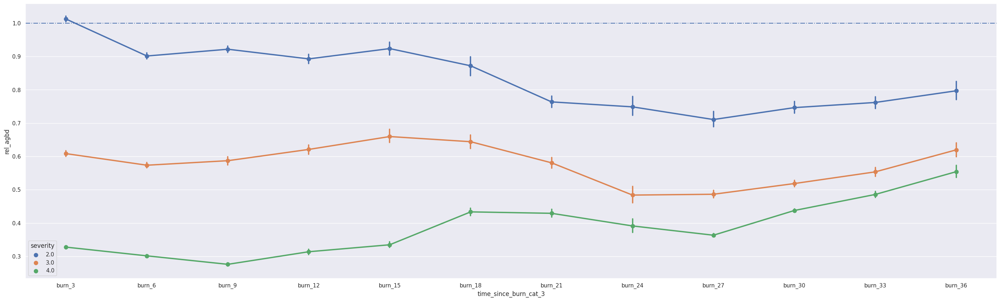

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_3', y='rel_agbd', hue='severity', estimator='mean')
ax.axhline(y=1, linestyle="-.")

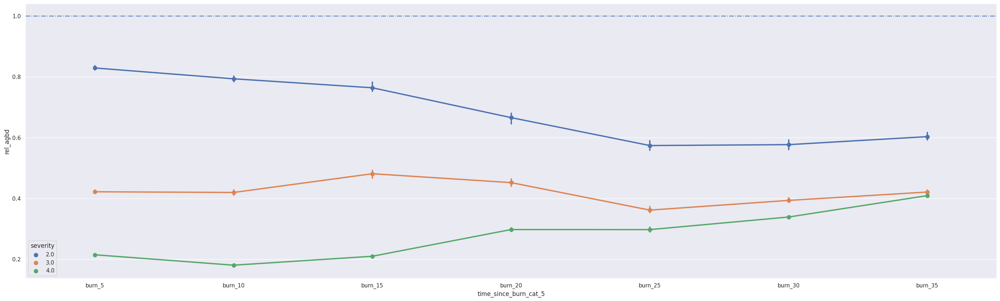

In [55]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_5', y='rel_agbd', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

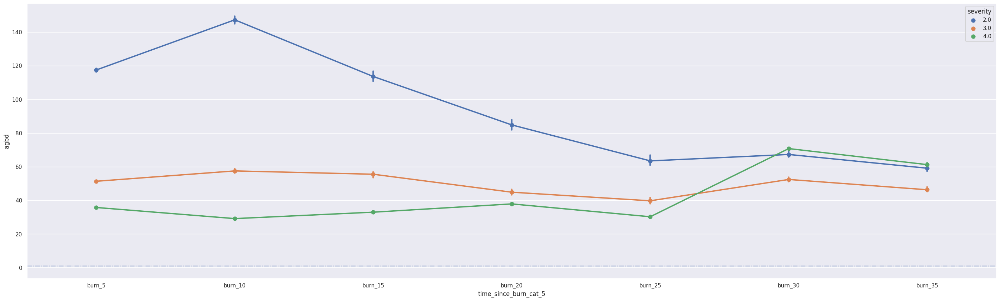

In [56]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_5', y='agbd', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

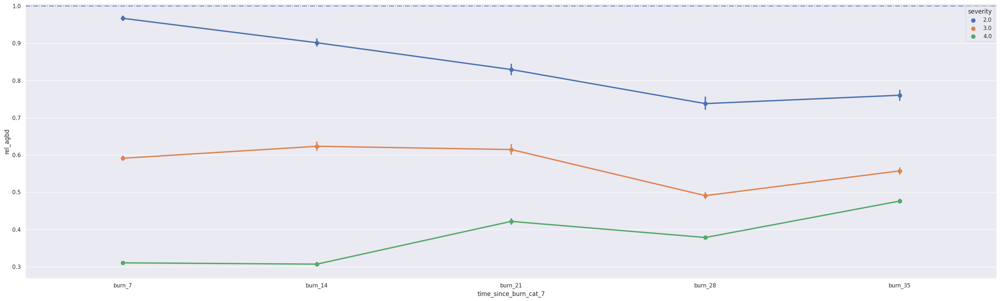

In [37]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_7', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

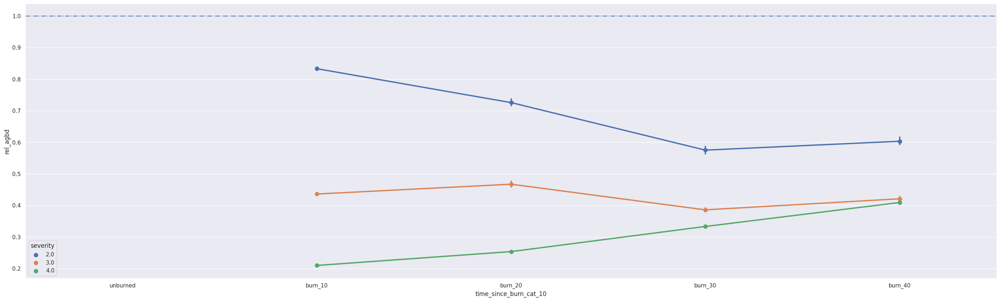

In [57]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_10', y='rel_agbd', hue='severity', estimator='median')
ax.axhline(y=1, linestyle="-.")

### Regression

In [94]:
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from src.data import stats
import numpy as np
importlib.reload(stats)

polynomial_features= PolynomialFeatures(degree=2)
to_fit = gedi_pipeline.get_severity(grouped, 4)
to_fit['time_since_burn_cat_3'].replace(['burn_3', 'burn_6', 'burn_9',
                "burn_12", "burn_15", "burn_18", "burn_21",
                "burn_24", "burn_27", "burn_30", "burn_33", "burn_36"],
                        range(0, 12), inplace=True)
to_fit = to_fit.dropna(subset='time_since_burn_cat_3')

x = np.reshape(to_fit['time_since_burn_cat_3'].to_numpy(), (to_fit['time_since_burn_cat_3'].to_numpy().shape[0], 1))
y = np.reshape(to_fit['rel_agbd'].to_numpy(), (to_fit['rel_agbd'].to_numpy().shape[0], 1))
xp = polynomial_features.fit_transform(x)

model = sm.OLS(y, xp).fit()
ypred = model.predict(xp)

ypred.shape
_, upper,lower = wls_prediction_std(model)
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     1230.
Date:                Sun, 18 Jun 2023   Prob (F-statistic):               0.00
Time:                        22:49:58   Log-Likelihood:                -50699.
No. Observations:              130189   AIC:                         1.014e+05
Df Residuals:                  130186   BIC:                         1.014e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.3267      0.002    199.266      0.0

In [99]:
to_fit.groupby("time_since_burn_cat_3").median(numeric_only=True).rel_agbd

time_since_burn_cat_3
0     0.226183
1     0.216836
2     0.183298
3     0.179663
4     0.200650
5     0.283588
6     0.296904
7     0.318672
8     0.293495
9     0.344857
10    0.369461
11    0.442110
Name: rel_agbd, dtype: float64

In [121]:
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from src.data import stats
import numpy as np
importlib.reload(stats)

to_fit = gedi_pipeline.get_severity(grouped, 4)
to_fit = to_fit.dropna(subset='time_since_burn_cat_3')
to_fit['time_since_burn_cat_3'].replace(['burn_3', 'burn_6', 'burn_9',
                "burn_12", "burn_15", "burn_18", "burn_21",
                "burn_24", "burn_27", "burn_30", "burn_33", "burn_36"],
                        range(0, 12), inplace=True)
medians = to_fit.groupby("time_since_burn_cat_3").median(numeric_only=True).rel_agbd

x = np.reshape(range(0, 12), (12, 1))
y = np.reshape(medians.to_numpy(), (12, 1))
print(x.shape)
xp = polynomial_features.fit_transform(x)

model = sm.OLS(y, xp).fit()
ypred = model.predict(xp)

ypred.shape
_, upper,lower = wls_prediction_std(model)
print(model.summary())

(12, 1)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.892
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                     37.23
Date:                Sun, 18 Jun 2023   Prob (F-statistic):           4.44e-05
Time:                        23:16:01   Log-Likelihood:                 26.943
No. Observations:                  12   AIC:                            -47.89
Df Residuals:                       9   BIC:                            -46.43
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2068      0.022      9.453 

/maps-priv/maps/fire-regen/fire-regen-env/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1736: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


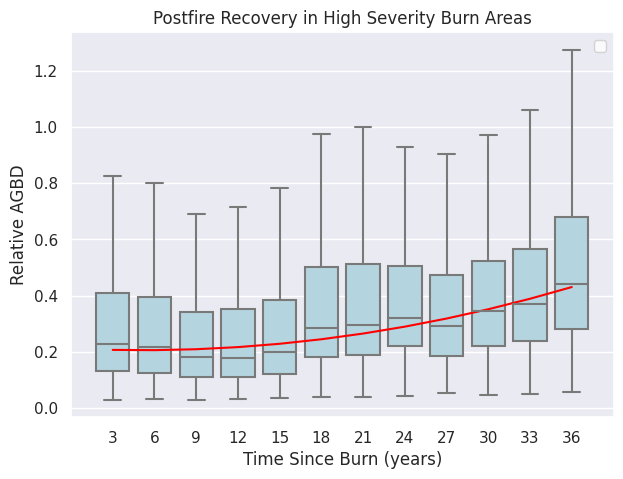

In [122]:
plt.figure(1, (7,5))
ax = sns.boxplot(x="time_since_burn_cat_3", y="rel_agbd", data=to_fit, color='lightblue', showfliers=False, order=np.arange(12))
ax.set_ylabel("Relative AGBD", fontsize=12)
ax.set_xlabel("Time Since Burn (years)", fontsize=12)
ax.set_xlim([-1, 12])
xs = np.arange(0, 11)
ax.set_xticklabels(range(3, 39, 3))
# cmap = plt.get_cmap('inferno')
get_ys = lambda a, b: a + b * xs
ax.set_title("Postfire Recovery in High Severity Burn Areas")


sns.lineplot(x=range(0, 12), y=ypred, color='red', ax=ax)

ax.legend(facecolor='white')
#ax.set_ylim([0, ])

In [123]:
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from src.data import stats
import numpy as np
importlib.reload(stats)

to_fit = gedi_pipeline.get_severity(grouped, 3)
to_fit = to_fit.dropna(subset='time_since_burn_cat_3')
to_fit['time_since_burn_cat_3'].replace(['burn_3', 'burn_6', 'burn_9',
                "burn_12", "burn_15", "burn_18", "burn_21",
                "burn_24", "burn_27", "burn_30", "burn_33", "burn_36"],
                        range(0, 12), inplace=True)
medians = to_fit.groupby("time_since_burn_cat_3").median(numeric_only=True).rel_agbd

x = np.reshape(range(0, 12), (12, 1))
y = np.reshape(medians.to_numpy(), (12, 1))
print(x.shape)
xp = polynomial_features.fit_transform(x)

model = sm.OLS(y, xp).fit()
ypred = model.predict(xp)

ypred.shape
_, upper,lower = wls_prediction_std(model)
print(model.summary())

(12, 1)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.130
Model:                            OLS   Adj. R-squared:                 -0.063
Method:                 Least Squares   F-statistic:                    0.6742
Date:                Sun, 18 Jun 2023   Prob (F-statistic):              0.534
Time:                        23:16:37   Log-Likelihood:                 22.235
No. Observations:                  12   AIC:                            -38.47
Df Residuals:                       9   BIC:                            -37.01
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4557      0.032     14.070 

/maps-priv/maps/fire-regen/fire-regen-env/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1736: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


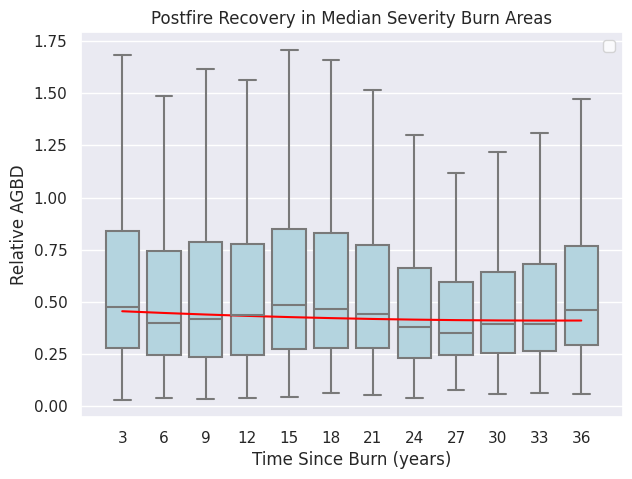

In [124]:
plt.figure(1, (7,5))
ax = sns.boxplot(x="time_since_burn_cat_3", y="rel_agbd", data=to_fit, color='lightblue', showfliers=False, order=np.arange(12))
ax.set_ylabel("Relative AGBD", fontsize=12)
ax.set_xlabel("Time Since Burn (years)", fontsize=12)
ax.set_xlim([-1, 12])
xs = np.arange(0, 11)
ax.set_xticklabels(range(3, 39, 3))
# cmap = plt.get_cmap('inferno')
get_ys = lambda a, b: a + b * xs
ax.set_title("Postfire Recovery in Median Severity Burn Areas")


sns.lineplot(x=range(0, 12), y=ypred, color='red', ax=ax)

ax.legend(facecolor='white')
#ax.set_ylim([0, ])

In [125]:
from sklearn.preprocessing import PolynomialFeatures
import statsmodels.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from src.data import stats
import numpy as np
importlib.reload(stats)

to_fit = gedi_pipeline.get_severity(grouped, 2)
to_fit = to_fit.dropna(subset='time_since_burn_cat_3')
to_fit['time_since_burn_cat_3'].replace(['burn_3', 'burn_6', 'burn_9',
                "burn_12", "burn_15", "burn_18", "burn_21",
                "burn_24", "burn_27", "burn_30", "burn_33", "burn_36"],
                        range(0, 12), inplace=True)
medians = to_fit.groupby("time_since_burn_cat_3").median(numeric_only=True).rel_agbd

x = np.reshape(range(0, 12), (12, 1))
y = np.reshape(medians.to_numpy(), (12, 1))
print(x.shape)
xp = polynomial_features.fit_transform(x)

model = sm.OLS(y, xp).fit()
ypred = model.predict(xp)

ypred.shape
_, upper,lower = wls_prediction_std(model)
print(model.summary())

(12, 1)
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     27.59
Date:                Sun, 18 Jun 2023   Prob (F-statistic):           0.000145
Time:                        23:19:59   Log-Likelihood:                 21.508
No. Observations:                  12   AIC:                            -37.02
Df Residuals:                       9   BIC:                            -35.56
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8889      0.034     25.831 

/maps-priv/maps/fire-regen/fire-regen-env/lib/python3.10/site-packages/scipy/stats/_stats_py.py:1736: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


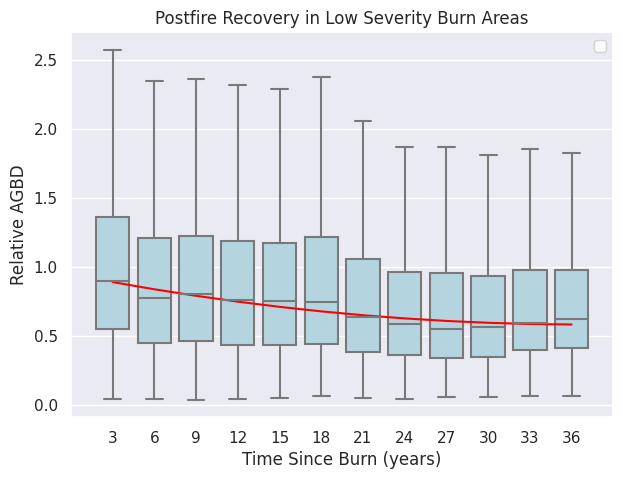

In [127]:
plt.figure(1, (7,5))
ax = sns.boxplot(x="time_since_burn_cat_3", y="rel_agbd", data=to_fit, color='lightblue', showfliers=False, order=np.arange(12))
ax.set_ylabel("Relative AGBD", fontsize=12)
ax.set_xlabel("Time Since Burn (years)", fontsize=12)
ax.set_xlim([-1, 12])
xs = np.arange(0, 11)
ax.set_xticklabels(range(3, 39, 3))
# cmap = plt.get_cmap('inferno')
get_ys = lambda a, b: a + b * xs
ax.set_title("Postfire Recovery in Low Severity Burn Areas")


sns.lineplot(x=range(0, 12), y=ypred, color='red', ax=ax)

ax.legend(facecolor='white')
#ax.set_ylim([0, ])

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(grouped, x='time_since_burn_cat_7', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

106024


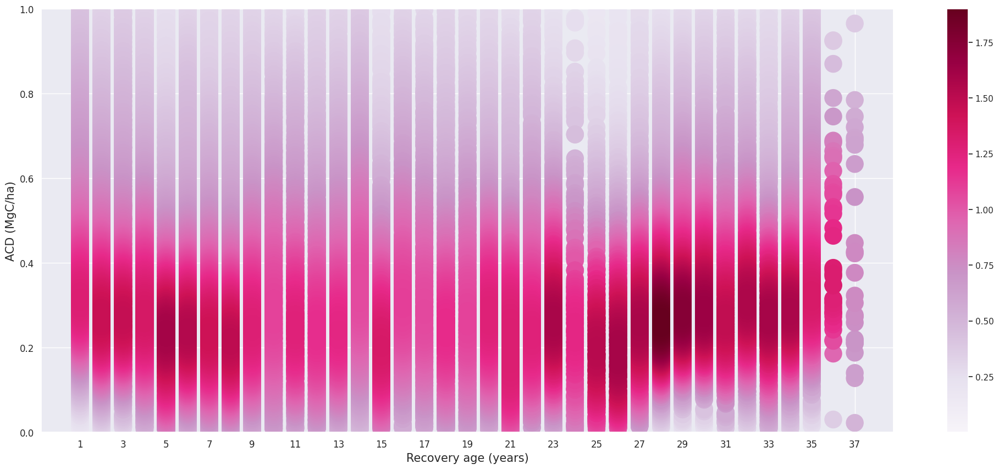

In [25]:
plot_pdf(gedi_recovery_2x2[gedi_recovery_2x2.severity == 3],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

In [ ]:
plot_pdf(filter_2x2[filter_2x2.severity == 3],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

In [32]:
mtbs_perimeters = gpd.read_file(f"{DATA_PATH}/mtbs/mtbs_perims_DD.shp")

In [39]:
mtbs_perimeters = mtbs_perimeters.to_crs("4326")

In [38]:
sierra_perimeters = mtbs_perimeters.sjoin(sierras, how="inner", predicate="within")
sierra_perimeters.drop(columns="index_right", inplace=True)
sierra_perimeters

/maps-priv/maps/fire-regen/fire-regen-env/lib/python3.10/site-packages/geopandas/geodataframe.py:2178: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4269
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)


,Event_ID,irwinID,Incid_Name,Incid_Type,Map_ID,Map_Prog,Asmnt_Type,BurnBndAc,BurnBndLat,BurnBndLon,...,dNBR_offst,dNBR_stdDv,NoData_T,IncGreen_T,Low_T,Mod_T,High_T,Comment,geometry,FID
22,CA3561111844619840526,NaN,WOODROW,Wildfire,4558,MTBS,Initial (SS),1118,35.611,-118.446,...,-9999,-9999,9999,9999,-25,-145,-225,NaN,"POLYGON ((-118.43784 35.60767, -118.43830 35.60612, -118.44015 35.60500, -118.44236 35.60364, -118.44505 35.60266, -118.44761 35.60175, -118.45011 35.60133, -118.45140 35.60201, -118.45397 35.60233, -118.45637 35.60210, -118.45823 35.60175, -118.45855 35.60256, -118.45672 35.60373, -118.45840 35.60521, -118.45846 35.60614, -118.46012 35.60634, -118.46279 35.60798, -118.46296 35.60999, -118.46304 35.61313, -118.46217 35.61411, -118.46120 35.61377, -118.45989 35.61403, -118.45888 35.61451, -118.45908 35.61617, -118.45839 35.61677, -118.45886 35.61784, -118.45920 35.61970, -118.45881 35.62036...",0
29,NV4068311976419840530,NaN,BUFFALO,Wildfire,4566,MTBS,Initial (SS),2069,40.683,-119.764,...,-9999,-9999,9999,9999,-50,-134,-190,NaN,"POLYGON ((-119.78591 40.69299, -119.78580 40.69301, -119.78535 40.69467, -119.78577 40.69682, -119.78535 40.69877, -119.78304 40.69980, -119.78382 40.70117, -119.78314 40.70352, -119.78170 40.70550, -119.78061 40.70529, -119.77813 40.70489, -119.77628 40.70407, -119.77470 40.70127, -119.77322 40.69945, -119.76426 40.69841, -119.76925 40.69746, -119.76671 40.69689, -119.76630 40.69521, -119.76477 40.69510, -119.76212 40.69443, -119.76022 40.69275, -119.75883 40.69073, -119.75748 40.69023, -119.75537 40.68817, -119.75468 40.68936, -119.75245 40.69014, -119.75085 40.69097, -119.74959 40.68957...",0
46,NV4027911982519840617,NaN,DRY VALLEY,Wildfire,4567,MTBS,Initial (SS),9035,40.279,-119.825,...,-9999,-9999,9999,9999,-80,-180,-250,NaN,"POLYGON ((-119.87156 40.27610, -119.87159 40.27826, -119.87148 40.27974, -119.87129 40.28124, -119.87147 40.28291, -119.87003 40.28371, -119.86975 40.28335, -119.86783 40.28501, -119.86702 40.28400, -119.86651 40.28252, -119.86510 40.28133, -119.86458 40.28072, -119.86424 40.28155, -119.86178 40.28185, -119.86074 40.28293, -119.85885 40.28125, -119.85871 40.28291, -119.85882 40.28412, -119.85753 40.28560, -119.85546 40.28523, -119.85500 40.28638, -119.85556 40.28826, -119.85790 40.28804, -119.85852 40.29214, -119.85762 40.29272, -119.85809 40.29409, -119.85852 40.29740, -119.85750 40.29760...",0
54,CA3549911888619840621,NaN,UNNAMED,Unknown,4720,MTBS,Initial (SS),1059,35.499,-118.886,...,-9999,-9999,9999,9999,-70,-9999,-9999,Single scene assessment,"POLYGON ((-118.87353 35.49235, -118.87397 35.49186, -118.87441 35.49118, -118.87493 35.49050, -118.87565 35.49024, -118.87622 35.49019, -118.87700 35.49038, -118.87783 35.49045, -118.87872 35.49028, -118.87928 35.48999, -118.87983 35.48941, -118.88045 35.48906, -118.88088 35.48880, -118.88174 35.48875, -118.88263 35.48857, -118.88359 35.48838, -118.88380 35.48811, -118.88448 35.48797, -118.88534 35.48792, -118.88576 35.48859, -118.88588 35.48898, -118.88689 35.48896, -118.88771 35.48879, -118.88881 35.48904, -118.88961 35.48953, -118.88980 35.49013, -118.89008 35.49107, -118.89018 35.49140...",0
60,CA3800412064719840624,NaN,SALT SPRING,Wildfire,4560,MTBS,Initial (SS),4837,38.004,-120.647,...,-9999,-9999,9999,9999,50,-250,-9999,NaN,"POLYGON ((-120.66427 38.00380, -120.66920 38.00837, -120.67327 38.01277, -120.67600 38.01678, -120.67663 38.02017, -120.67484 38.02201, -120.67698 38.02338, -120.67772 38.02446, -120.68002 38.02586, -120.68138 38.02763, -120.68217 38.02794, -120.68439 38.03112, -120.68573 38.03107, -120.68926 38.03211, -120.69028 38.03154, -120.69220 38.03209, -120.69350 38.03170, -120.69509 38.03325, -120.69231 38.03505, -120.68523 38.03610, -120.68347 38.03535, -120.68234 38.03605, -120.67811 38.03405, -120.67623 38.03297, -120.67372 38.03273, -120.67358 38.03540, -120.67283 38.03672, -120.66938 38.03550...",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29427,CA3

### Filter for tiny fires

In [134]:
sierras = gpd.read_file(f"{USER_PATH}/data/shapefiles/sierras_convex_hull.shp")
firep_db = FirePerimetersDB(f"{USER_PATH}/data/fire_perimeters.gdb/")
sierra_firep = FirePerimeters(firep_db).filter_within_geometry(sierras)

In [136]:
perimeters = sierra_firep.perimeters

In [137]:
perimeters["area_acres"] = perimeters.Shape_Area / 4046.8564224

In [142]:
filter_2x2.shape[0]

334072

In [143]:
perimeters = perimeters[perimeters.YEAR_.isin([str(year) for year in range(1984, 2023)])]

In [144]:
perimeters[perimeters.area_acres < 1000].shape[0]

3135

In [ ]:
perimeters[perimeters.]

In [24]:
gedi_matched.shape

(218923, 23)

In [145]:
gedi_filtered = filter_2x2.copy()
for perimeter in perimeters[perimeters.area_acres < 1000].itertuples():
    fire = perimeters[perimeters.index == perimeter.Index]

    gedi_filtered = gedi_filtered[~gedi_filtered.index.isin(gedi_filtered.sjoin(fire, how="inner", predicate="within").index)]
gedi_filtered.shape[0]

329143

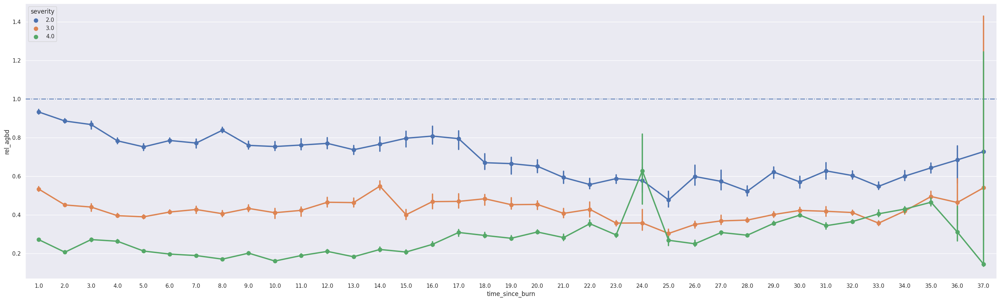

In [146]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_filtered, x='time_since_burn', y='rel_agbd', hue='severity', estimator="median")
ax.axhline(y=1, linestyle="-.")

115785


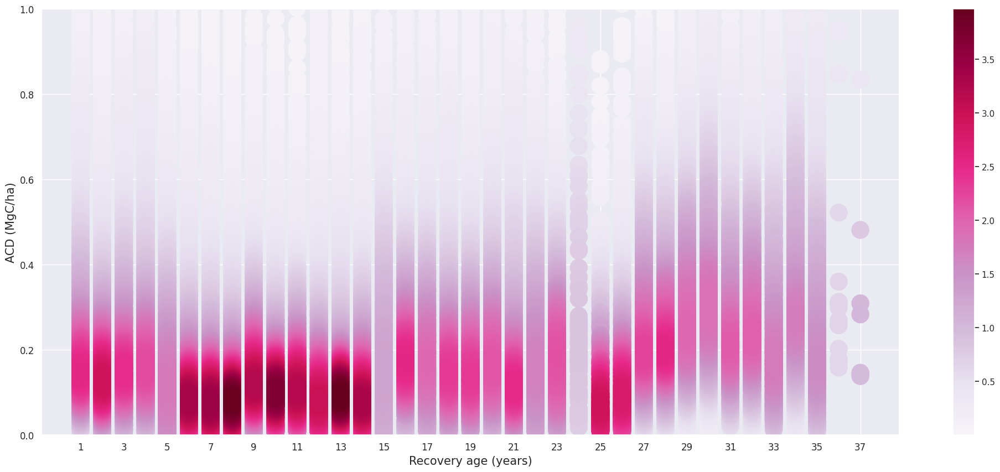

In [30]:
plot_pdf(gedi_filtered[gedi_filtered.severity == 4],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

In [27]:
gedi_filtered['rel_agbd'] = gedi_filtered.agbd / gedi_filtered.agbd_control

<Axes: >

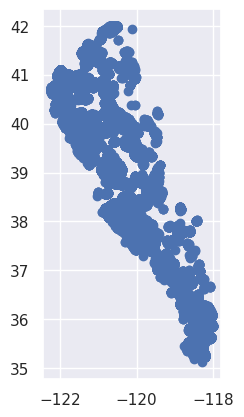

In [15]:
gedi_matched[~gedi_matched.index.isin(gedi_matched.sjoin(creek, how="inner", predicate="within").index)].plot()

<Axes: >

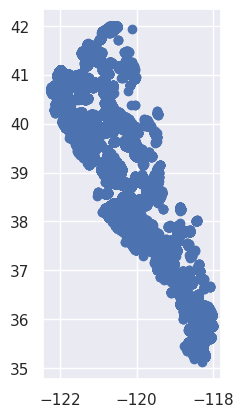

In [16]:
gedi_matched.plot()

In [33]:
gedi_matched.symmetric_difference(creek.geometry.iloc[0])

In [ ]:
for perimeter in perimeters.itertuples():
    fire = perimeters[perimeters.index == perimeter.Index]

    

## Regen analysis for 2x2 - B

In [50]:
gedi_matched = regen_analysis.process_all_fires_with_rf_control_per_burn_year(f"{DATA_PATH}/rf/burned/2x2", f"{DATA_PATH}/rf/models_ver_B")

Process fires for year 1985.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1986.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1987.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1988.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1989.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1990.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1991.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1992.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1993.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1994.
matching shots within fire
Processi

In [51]:
gedi_matched['rel_agbd'] = gedi_matched.agbd / gedi_matched.agbd_control
gedi_matched = gedi_matched[gedi_matched.burn_count == 1]
gedi_matched_trees = gedi_matched[gedi_matched.pft_class == 1]

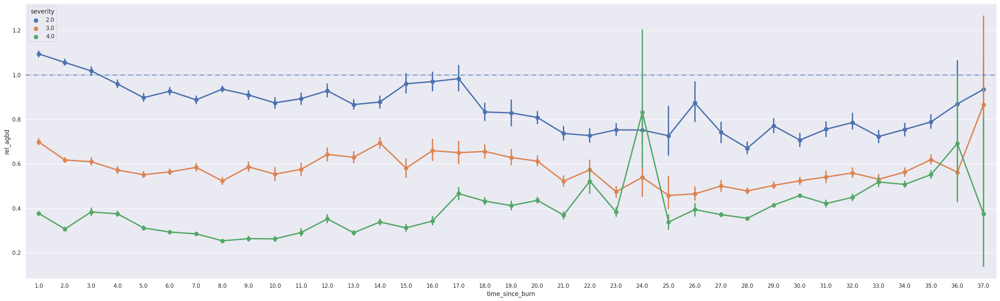

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_trees, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

## Regen analysis for 3x3 - B

In [40]:
gedi_matched = regen_analysis.process_all_fires_with_rf_control_per_burn_year(f"{DATA_PATH}/rf/burned/3x3", f"{DATA_PATH}/rf/models_ver_B")

Process fires for year 1985.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1986.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1987.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1988.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1989.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1990.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1991.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1992.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1993.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1994.
matching shots within fire
Processi

In [41]:
gedi_matched['rel_agbd'] = gedi_matched.agbd / gedi_matched.agbd_control
gedi_matched = gedi_matched[gedi_matched.burn_count == 1]
gedi_matched_trees = gedi_matched[gedi_matched.pft_class == 1]

In [44]:
gedi_matched = gedi_matched[gedi_matched.burn_count == 1]

In [45]:
gedi_matched_trees = gedi_matched[gedi_matched.pft_class == 1]

In [42]:
gedi_matched.shape[0]

218923

In [43]:
gedi_matched[gedi_matched.burn_count == 1]

,shot_number,longitude,latitude,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,...,severity,burn_year,burn_count,time_since_burn,elevation,slope,aspect,soil,agbd_control,rel_agbd
68233,42640600300521207,-120.750616,38.172525,27.992105,5.854515,66.616653,2.982341,full,0.972790,6,...,2.0,1985.0,1.0,34.0,387.555556,24.000000,57.222222,0.0,112.240336,0.249394
70255,191910500200119943,-120.740033,38.155407,123.460587,31.679453,275.364624,11.100678,full,0.988443,1,...,2.0,1985.0,1.0,37.0,539.000000,20.000000,48.666667,0.0,102.150819,1.208611
72312,81650600200449990,-120.754568,38.096837,16.602076,-9999.000000,91.402557,11.113122,full,0.958655,1,...,4.0,1985.0,1.0,35.0,345.000000,8.000000,185.000000,0.0,67.179398,0.247130
72313,81650600200449991,-120.754079,38.097166,18.214243,-9999.000000,95.125694,11.111183,full,0.961252,1,...,4.0,1985.0,1.0,35.0,354.222222,10.222222,197.222222,0.0,75.308522,0.241862
73150,225021100200119926,-120.738474,38.154606,83.151505,13.214792,213.226410,11.103502,full,0.984161,1,...,2.0,1985.0,1.0,37.0,512.333333,25.333333,51.666667,0.0,97.818172,0.850062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27618963,225630800200085757,-119.553059,38.564323,122.198563,31.039167,273.485962,11.101624,full,0.988854,1,...,2.0,2020.0,1.0,2.0,2090.000000,30.666667,289.666667,19.0,99.695585,1.225717
27618964,225630800200085760,-119.551527,38.565317,28.583668,-9999.000000,117.301216,11.106215,full,0.983052,1,...,2.0,2020.0,1.0,2.0,2126.000000,25.333333,301.333333,19.0,80.235779,0.356246
27618967,225630800200085764,-119.549511,38.566621,20.807606,-9999.000000,100.928558,11.108585,full,0.968726,1,...,3.0,2020.0,1.0,2.0,2134.333333,11.333333,9.666667,19.0,72.595643,0.286623
27618975,225631100200080331,-119.554363,38.556271,131.316925,35.723694,287.024231,11.099050,full,0.994654,1,...,2.0,2020.0,1.0,2.0,2144.333333,29.666667,278.333333,19.0,118.468859,1.108451


In [19]:
print(gedi_matched_trees[(gedi_matched_trees.time_since_burn == 5) & (gedi_matched_trees.severity == 2)].mean())
print(gedi_matched_trees[(gedi_matched_trees.time_since_burn == 5) & (gedi_matched_trees.severity == 2)].std())
print(gedi_matched_trees_2[(gedi_matched_trees.time_since_burn == 5) & (gedi_matched_trees.severity == 2)].mean())

,shot_number,longitude,latitude,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,...,severity,burn_year,burn_count,time_since_burn,elevation,slope,aspect,soil,agbd_control,rel_agbd
2154421,48550100200078142,-120.680048,38.792635,221.652328,88.449089,414.987732,11.102393,coverage,0.968350,1,...,2.0,2014.0,1.0,5.0,682.111111,37.888889,278.222222,19.0,240.051035,0.923355
2194996,48550300200078058,-120.661560,38.790566,181.701340,63.917866,359.650848,11.108645,coverage,0.976756,1,...,2.0,2014.0,1.0,5.0,660.555556,22.555556,113.111111,5.0,172.133982,1.055581
2523780,48550100200078154,-120.673954,38.796560,210.159332,81.158669,399.397644,11.121867,coverage,0.974294,1,...,2.0,2014.0,1.0,5.0,722.333333,35.333333,320.333333,19.0,243.935180,0.861538
2524293,48550100200078132,-120.685083,38.789400,69.569130,8.168209,191.092331,11.100563,coverage,0.959238,1,...,2.0,2014.0,1.0,5.0,648.222222,32.777778,143.666667,19.0,172.392078,0.403552
2526005,48550300200078099,-120.640762,38.803937,306.494324,144.527374,528.632324,11.109563,coverage,0.992039,1,...,2.0,2014.0,1.0,5.0,700.000000,32.000000,316.333333,5.0,334.465313,0.916371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27518746,194810000200062675,-120.924798,39.922261,290.192596,133.416046,507.127594,11.107244,coverage,0.954482,1,...,2.0,2017.0,1.0,5.0,1289.222222,4.555556,139.222222,0.0,178.409858,1.626550
27518767,194810100200058920,-120.921148,39.917263,182.097427,64.098694,360.336487,11.122354,coverage,0.966954,1,...,2.0,2017.0,1.0,5.0,1220.000000,21.000000,310.000000,0.0,440.888725,0.413024
27524519,194810300200058869,-120.921951,39.903272,236.528076,97.735558,435.674164,11.143270,coverage,0.963956,1,...,2.0,2017.0,1.0,5.0,1370.666667,14.000000,331.666667,0.0,371.195082,0.637207
27524520,194810300200058870,-120.921409,39.903595,283.914978,129.082184,498.991577,11.123005,coverage,0.966781,1,...,2.0,2017.0,1.0,5.0,1376.666667,17.000000,300.666667,0.0,283.205555,1.002505


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


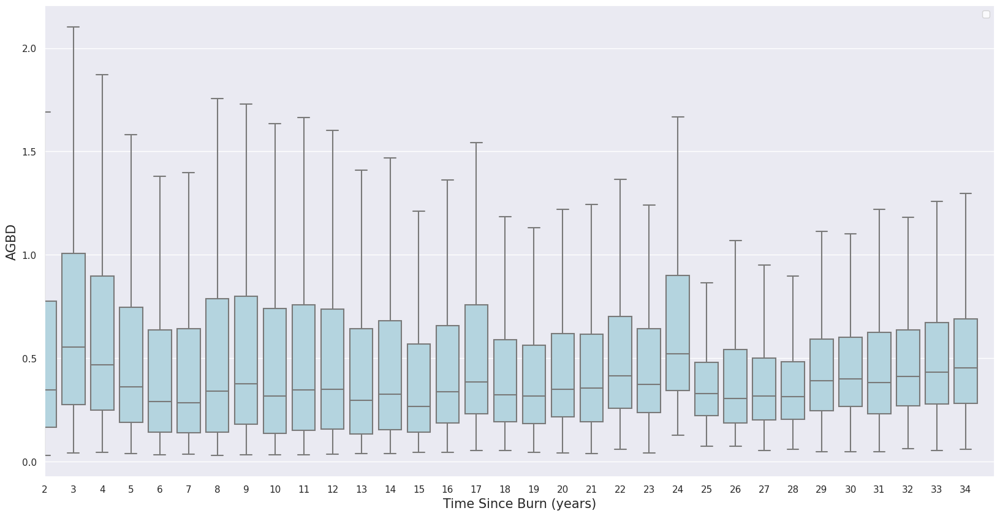

In [21]:
import numpy as np
plt.figure(1, (20,10))
ax = sns.boxplot(x="time_since_burn", y="rel_agbd", data=gedi_matched_trees, color='lightblue', showfliers=False, order=np.arange(35))
ax.set_ylabel("AGBD", fontsize=15)
ax.set_xlabel("Time Since Burn (years)", fontsize=15)
ax.set_xlim([2,35])
xs = np.arange(2, 35)

ax.legend(facecolor='white')
#ax.set_ylim([0, ])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


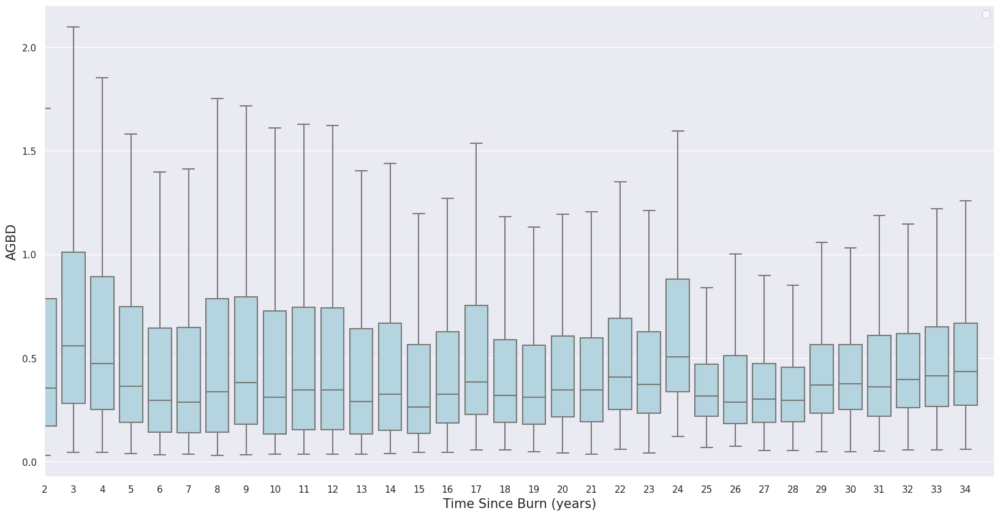

In [22]:
import numpy as np
plt.figure(1, (20,10))
ax = sns.boxplot(x="time_since_burn", y="rel_agbd", data=gedi_matched_trees_2, color='lightblue', showfliers=False, order=np.arange(35))
ax.set_ylabel("AGBD", fontsize=15)
ax.set_xlabel("Time Since Burn (years)", fontsize=15)
ax.set_xlim([2,35])
xs = np.arange(2, 35)

ax.legend(facecolor='white')
#ax.set_ylim([0, ])

90043


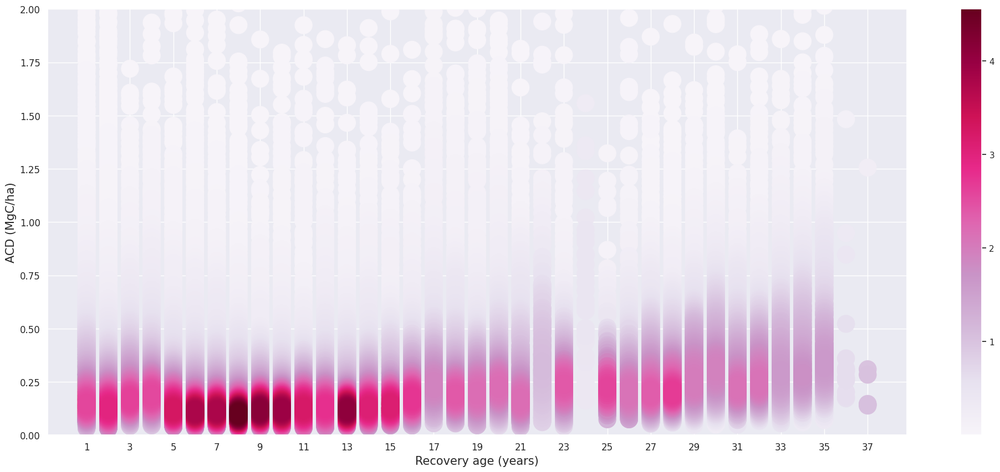

In [49]:
plot_pdf(gedi_matched_trees[gedi_matched_trees.severity == 4],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 2))

50521


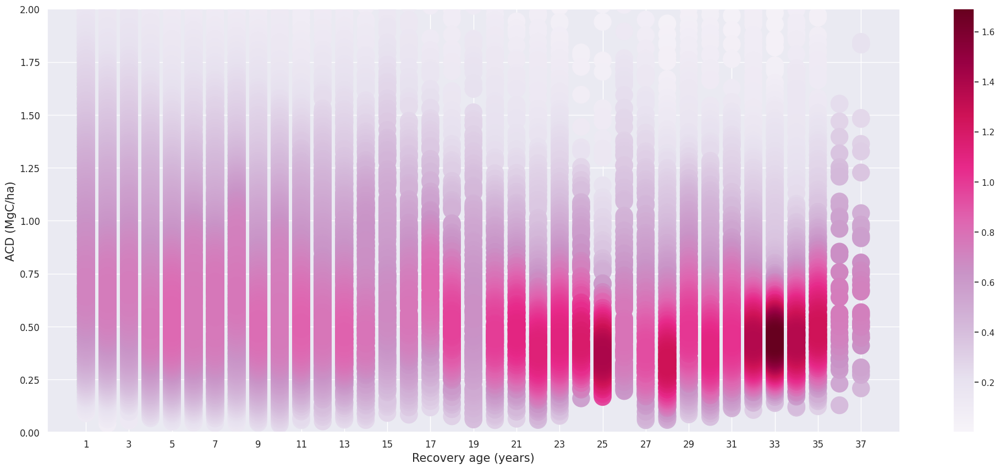

In [17]:
plot_pdf(gedi_matched_trees_2[gedi_matched_trees_2.severity == 2],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 2))

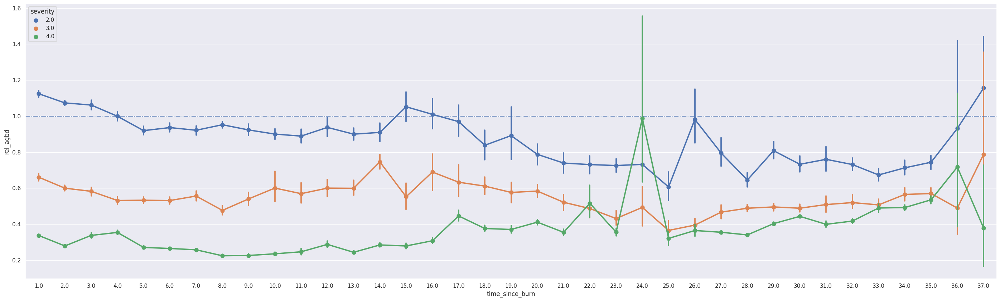

In [48]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_trees, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

## Regen analysis for 3x3 gedi shots

In [10]:
gedi_matched_2 = regen_analysis.process_all_fires_with_rf_control_per_burn_year(f"{DATA_PATH}/rf/burned/3x3")

Process fires for year 1985.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1986.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1987.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1988.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1989.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1990.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1991.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1992.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1993.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1994.
matching shots within fire
Processi

In [11]:
gedi_matched_2['rel_agbd'] = gedi_matched_2.agbd / gedi_matched_2.agbd_control

In [12]:
gedi_matched_trees_2 = gedi_matched_2[gedi_matched_2.pft_class == 1]

In [13]:
gedi_matched_trees_2

,shot_number,longitude,latitude,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,...,severity,burn_year,burn_count,time_since_burn,elevation,slope,aspect,soil,agbd_control,rel_agbd
70255,191910500200119943,-120.740033,38.155407,123.460587,31.679453,275.364624,11.100678,full,0.988443,1,...,2.0,1985.0,1.0,37.0,539.000000,20.000000,48.666667,0.0,100.605161,1.227179
72312,81650600200449990,-120.754568,38.096837,16.602076,-9999.000000,91.402557,11.113122,full,0.958655,1,...,4.0,1985.0,1.0,35.0,345.000000,8.000000,185.000000,0.0,62.928008,0.263826
72313,81650600200449991,-120.754079,38.097166,18.214243,-9999.000000,95.125694,11.111183,full,0.961252,1,...,4.0,1985.0,1.0,35.0,354.222222,10.222222,197.222222,0.0,70.196329,0.259476
73150,225021100200119926,-120.738474,38.154606,83.151505,13.214792,213.226410,11.103502,full,0.984161,1,...,2.0,1985.0,1.0,37.0,512.333333,25.333333,51.666667,0.0,103.647873,0.802250
2260492,204310800300304361,-120.757143,38.096809,101.912163,21.273869,242.672516,11.100528,full,0.988056,1,...,4.0,1985.0,1.0,37.0,337.000000,15.000000,229.333333,0.0,68.853135,1.480138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27618963,225630800200085757,-119.553059,38.564323,122.198563,31.039167,273.485962,11.101624,full,0.988854,1,...,2.0,2020.0,1.0,2.0,2090.000000,30.666667,289.666667,19.0,105.198435,1.161601
27618964,225630800200085760,-119.551527,38.565317,28.583668,-9999.000000,117.301216,11.106215,full,0.983052,1,...,2.0,2020.0,1.0,2.0,2126.000000,25.333333,301.333333,19.0,81.820967,0.349344
27618967,225630800200085764,-119.549511,38.566621,20.807606,-9999.000000,100.928558,11.108585,full,0.968726,1,...,3.0,2020.0,1.0,2.0,2134.333333,11.333333,9.666667,19.0,74.188719,0.280469
27618975,225631100200080331,-119.554363,38.556271,131.316925,35.723694,287.024231,11.099050,full,0.994654,1,...,2.0,2020.0,1.0,2.0,2144.333333,29.666667,278.333333,19.0,109.821963,1.195726


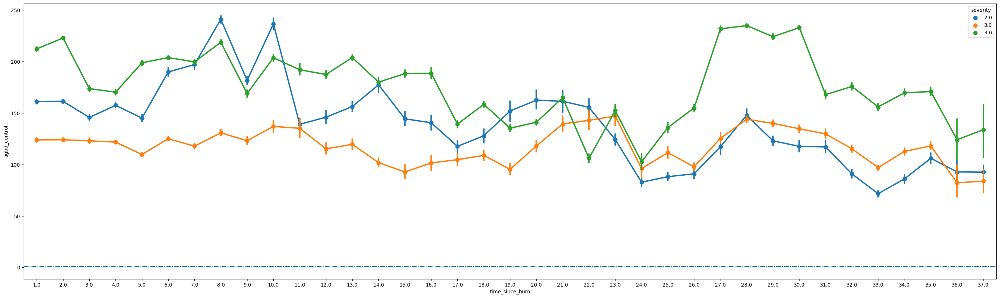

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched, x='time_since_burn', y='agbd_control', hue='severity')
ax.axhline(y=1, linestyle="-.")

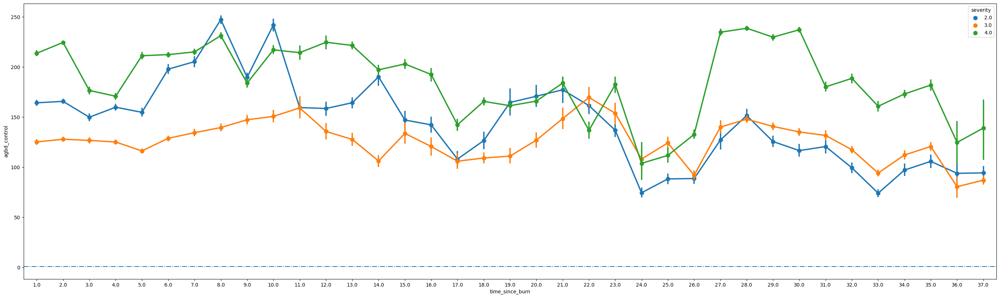

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_trees, x='time_since_burn', y='agbd_control', hue='severity')
ax.axhline(y=1, linestyle="-.")

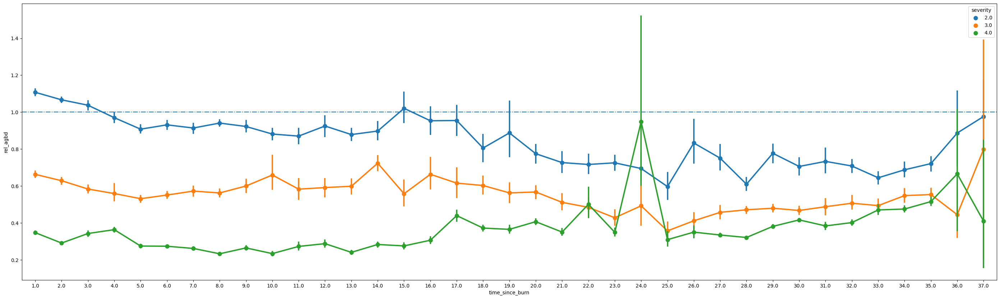

In [22]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_trees, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

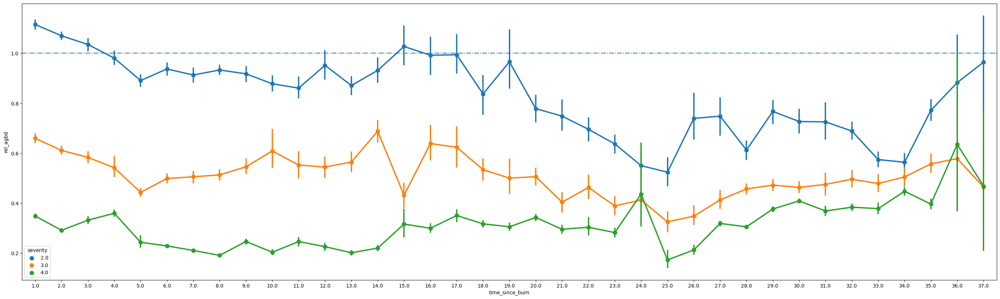

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

## Regen analysis for 2x2 gedi shots

In [6]:
gedi_matched_2 = regen_analysis.process_all_fires_with_rf_control_per_burn_year(f"{DATA_PATH}/rf/burned/2x2")

Process fires for year 1985.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1986.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1987.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1988.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1989.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1990.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1991.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1992.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1993.
matching shots within fire
Processing data
Run RF to predict control AGBD.
Process fires for year 1994.
matching shots within fire
Processi

In [11]:
gedi_matched_2['rel_agbd'] = gedi_matched_2.agbd / gedi_matched_2.agbd_control

In [16]:
gedi_matched_2_trees = gedi_matched_2[gedi_matched_2.pft_class == 1]

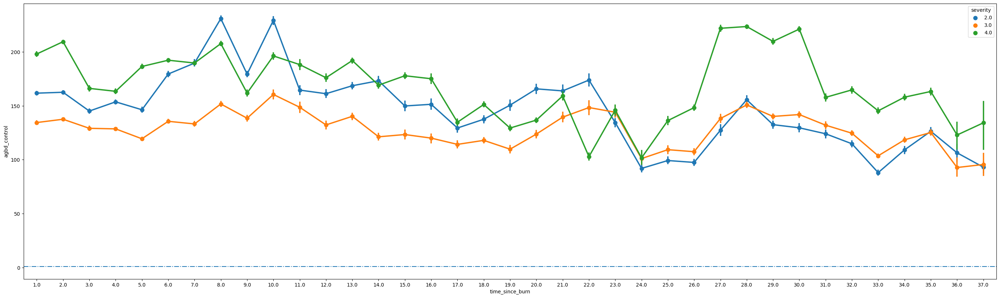

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_2, x='time_since_burn', y='agbd_control', hue='severity')
ax.axhline(y=1, linestyle="-.")

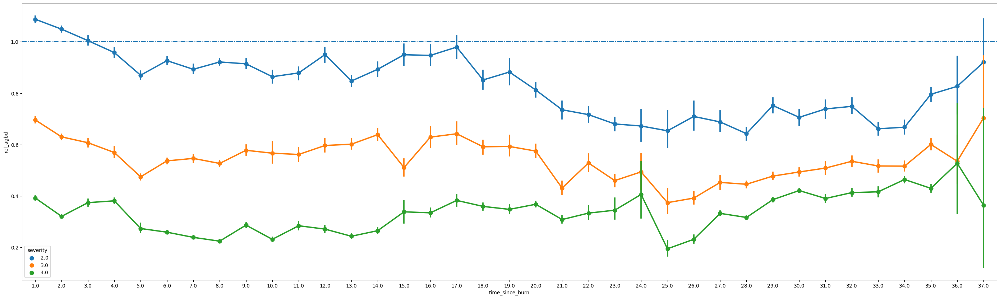

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_2, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

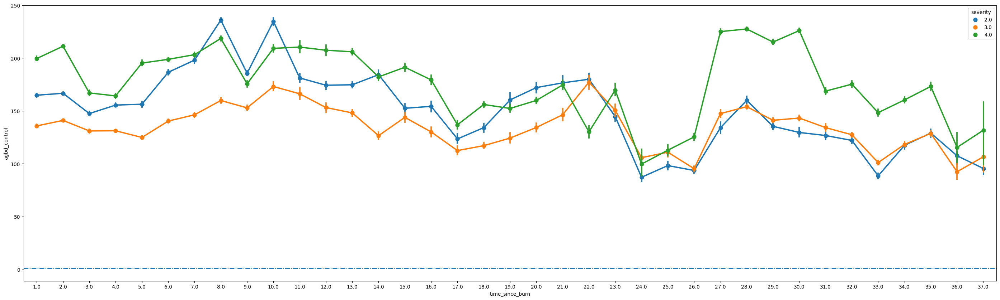

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_2_trees, x='time_since_burn', y='agbd_control', hue='severity')
ax.axhline(y=1, linestyle="-.")

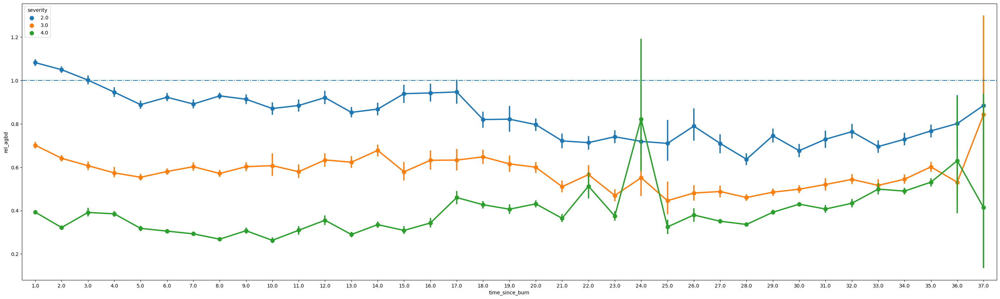

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_matched_2_trees, x='time_since_burn', y='rel_agbd', hue='severity')
ax.axhline(y=1, linestyle="-.")

In [23]:
gedi_matched_2_trees[gedi_matched_2_trees.time_since_burn == 27]

,shot_number,longitude,latitude,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,...,severity,burn_year,burn_count,time_since_burn,elevation,slope,aspect,soil,agbd_control,rel_agbd
2009754,28900600300590188,-120.507576,38.179015,61.934311,5.695565,178.306152,11.102563,full,0.964628,1,...,3.0,1992.0,1.0,27.0,493.00,23.00,163.50,5.0,144.966857,0.427231
2022105,28900800300235650,-120.511065,38.171417,107.579773,23.907804,251.367493,11.099358,full,0.973771,1,...,2.0,1992.0,1.0,27.0,650.50,20.50,176.00,5.0,138.048360,0.779290
2022112,28900800300235664,-120.504066,38.166787,100.781990,20.758692,240.928665,11.100762,full,0.950629,1,...,2.0,1992.0,1.0,27.0,527.50,12.00,214.00,5.0,136.454094,0.738578
2023646,28900800300235632,-120.520063,38.177344,112.817490,26.410229,259.339722,11.099211,full,0.971803,1,...,3.0,1992.0,1.0,27.0,615.50,9.00,206.50,5.0,90.114445,1.251936
2023649,28900800300235638,-120.517058,38.175349,137.951721,39.201389,296.854614,11.106153,full,0.978508,1,...,2.0,1992.0,1.0,27.0,425.00,8.00,327.00,5.0,123.939581,1.113056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22197725,179400100200078524,-120.714522,38.174184,15.642823,-9999.000000,89.136017,11.113858,coverage,0.950568,1,...,2.0,1995.0,1.0,27.0,688.00,13.50,230.00,0.0,57.206462,0.273445
22197731,179400200200083801,-120.714770,38.167493,73.073761,9.392299,196.895706,11.103925,coverage,0.958226,1,...,2.0,1995.0,1.0,27.0,558.25,18.50,265.00,0.0,75.200517,0.971719
22197734,179400200200083806,-120.712238,38.169157,113.251709,26.618568,260.003998,11.099983,coverage,0.971849,1,...,3.0,1995.0,1.0,27.0,706.50,26.00,259.00,0.0,81.248721,1.393889
22197783,191910500200119992,-120.715519,38.171699,32.176132,0.035454,124.467705,11.105848,full,0.988401,1,...,2.0,1995.0,1.0,27.0,600.50,21.00,242.50,0.0,79.729990,0.403564


In [38]:
filtered = gedi_matched_2_trees[(gedi_matched_2_trees.time_since_burn == 27) & (gedi_matched_2_trees.agbd_control > 200)]
filtered

,shot_number,longitude,latitude,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,...,severity,burn_year,burn_count,time_since_burn,elevation,slope,aspect,soil,agbd_control,rel_agbd
2499890,19581100300229937,-120.374480,38.777621,84.449303,13.741662,215.275955,11.099963,full,0.987020,1,...,4.0,1992.0,1.0,27.0,1307.0,11.50,168.50,5.0,307.868227,0.274303
2499891,19581100300229939,-120.373461,38.776970,76.916794,10.805129,203.157364,11.101789,full,0.983520,1,...,4.0,1992.0,1.0,27.0,1307.0,12.00,233.00,5.0,236.717804,0.324930
2499895,19581100300229944,-120.370905,38.775336,119.482811,29.676689,269.419617,11.102119,full,0.986525,1,...,4.0,1992.0,1.0,27.0,1277.0,20.00,155.00,5.0,274.620323,0.435084
2499896,19581100300229947,-120.369372,38.774356,142.465103,41.645100,303.402313,11.099630,full,0.986277,1,...,4.0,1992.0,1.0,27.0,1237.0,7.00,290.00,5.0,321.614461,0.442969
2499943,34050600200453745,-120.370719,38.772328,340.160309,167.767578,572.853394,11.133463,full,0.989626,1,...,4.0,1992.0,1.0,27.0,1242.0,24.00,293.00,5.0,245.928909,1.383165
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21987898,141320300300287812,-120.332767,38.059909,202.500824,76.515060,388.612946,11.101319,coverage,0.965594,1,...,3.0,1994.0,1.0,27.0,837.5,25.00,353.00,5.0,212.370961,0.953524
21988856,141320000300288974,-120.327224,38.075656,177.100082,61.225586,353.105957,11.102240,coverage,0.967150,1,...,2.0,1994.0,1.0,27.0,738.0,26.00,167.00,5.0,227.574681,0.778206
21988876,141320100300287852,-120.327648,38.068777,214.915009,84.187981,405.803284,11.107757,coverage,0.969211,1,...,2.0,1994.0,1.0,27.0,817.0,32.00,4.50,5.0,233.698757,0.919624
24486307,130950800300190631,-120.284972,39.574719,26.363438,-9999.000000,112.763741,11.107406,full,0.984634,1,...,4.0,1994.0,1.0,27.0,1798.5,22.25,178.25,5.0,238.127625,0.110711


/maps-priv/maps/fire-regen/fire-regen-env/lib/python3.10/site-packages/geopandas/geodataframe.py:1475: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


<Axes: >

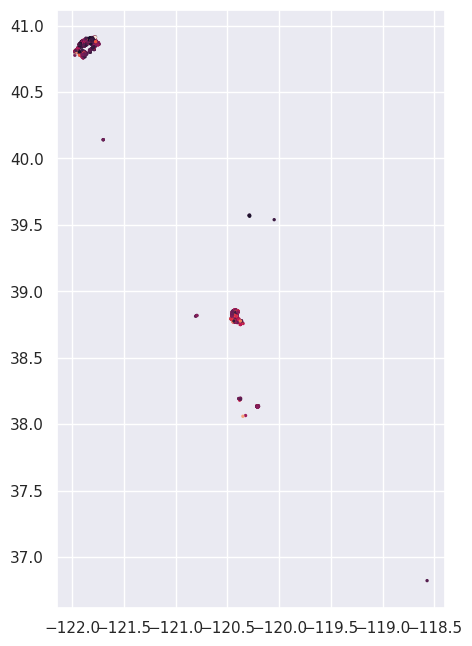

In [39]:
fig, ax = plt.subplots(1, 1, figsize=(5, 15))
filtered[(gedi_matched_2_trees.severity == 4)].plot(column='rel_agbd', ax=ax, vmin=0, vmax=1, markersize=2)
#gedi_matched_2_trees[(gedi_matched_2_trees.time_since_burn == 27) & (gedi_matched_2_trees.severity == 3)].plot(ax=ax, color='green', alpha=0.5)

/maps-priv/maps/fire-regen/fire-regen-env/lib/python3.10/site-packages/geopandas/geodataframe.py:1475: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


<Axes: >

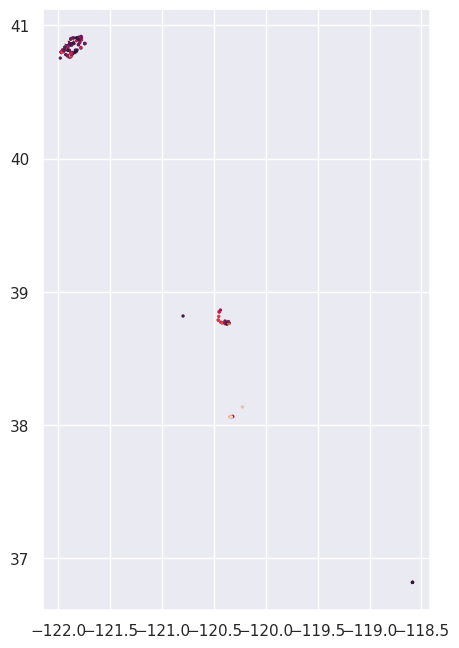

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(5, 15))
filtered[(gedi_matched_2_trees.severity == 3)].plot(column='rel_agbd', ax=ax, vmin=0, vmax=1, markersize=2)
#gedi_matched_2_trees[(gedi_matched_2_trees.time_since_burn == 27) & (gedi_matched_2_trees.severity == 3)].plot(ax=ax, color='green', alpha=0.5)